# Intro  
Le jeu de données FD004 est le quatrième de la série.

*   Trajectoires d'entraînement : 248
*   Trajectoires de test : 249
*   Conditions : SIX
*   Modes de panne : DEUX (dégradation du compresseur haute pression, dégradation du ventilateur)





In [ ]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

Plongeons dans l'analyse en chargeant les données et en commençant notre analyse exploratoire des données (EDA) en inspectant les premières lignes, afin de se faire une idée de l'apparence des données.

In [ ]:
# define filepath to read data
dir_path = './CMAPSSData/'

# define column names for easy indexing
index_names = ['unit_nr', 'time_cycles']
setting_names = ['setting_1', 'setting_2', 'setting_3']
sensor_names = ['s_{}'.format(i) for i in range(1,22)]
col_names = index_names + setting_names + sensor_names

# read data
train = pd.read_csv((dir_path+'train_FD004.txt'), sep='\s+', header=None, names=col_names)
x_test = pd.read_csv((dir_path+'test_FD004.txt'), sep='\s+', header=None, names=col_names)
y_test = pd.read_csv((dir_path+'RUL_FD004.txt'), sep='\s+', header=None, names=['RUL'])

train.head()

,unit_nr,time_cycles,setting_1,setting_2,setting_3,s_1,s_2,s_3,s_4,s_5,...,s_12,s_13,s_14,s_15,s_16,s_17,s_18,s_19,s_20,s_21
0,1,1,42.0049,0.8400,100.0,445.00,549.68,1343.43,1112.93,3.91,...,129.78,2387.99,8074.83,9.3335,0.02,330,2212,100.00,10.62,6.3670
1,1,2,20.0020,0.7002,100.0,491.19,606.07,1477.61,1237.50,9.35,...,312.59,2387.73,8046.13,9.1913,0.02,361,2324,100.00,24.37,14.6552
2,1,3,42.0038,0.8409,100.0,445.00,548.95,1343.12,1117.05,3.91,...,129.62,2387.97,8066.62,9.4007,0.02,329,2212,100.00,10.48,6.4213
3,1,4,42.0000,0.8400,100.0,445.00,548.70,1341.24,1118.03,3.91,...,129.80,2388.02,8076.05,9.3369,0.02,328,2212,100.00,10.54,6.4176
4,1,5,25.0063,0.6207,60.0,462.54,536.10,1255.23,1033.59,7.05,...,164.11,2028.08,7865.80,10.8366,0.02,305,1915,84.93,14.03,8.6754


In [ ]:
#Supprimer toutes les lignes supplémentaires et conserver uniquement le dernier cycle de chaque moteur.
x_test=x_test.groupby('unit_nr').last().reset_index()
x_test.shape

(248, 26)

In [ ]:
# Imputer les NAN avec la moyenne
train.fillna(train.mean(), inplace=True)
x_test.fillna(x_test.mean(), inplace=True)
y_test.fillna(y_test.mean(), inplace=True)


##Vérification des valeurs manquantes :

In [ ]:
def check_missing_values(data):
    print('Verifing the existance of null data:')
    return data.isnull().sum()

print(check_missing_values(train))

Verifing the existance of null data:
unit_nr        0
time_cycles    0
setting_1      0
setting_2      0
setting_3      0
s_1            0
s_2            0
s_3            0
s_4            0
s_5            0
s_6            0
s_7            0
s_8            0
s_9            0
s_10           0
s_11           0
s_12           0
s_13           0
s_14           0
s_15           0
s_16           0
s_17           0
s_18           0
s_19           0
s_20           0
s_21           0
dtype: int64


## Statistiques descriptives

In [ ]:
# inspect unit_nr
train[index_names].describe()

,unit_nr,time_cycles
count,61249.000000,61249.000000
mean,124.325181,134.311417
std,71.995350,89.783389
min,1.000000,1.000000
25%,60.000000,62.000000
50%,126.000000,123.000000
75%,185.000000,191.000000
max,249.000000,543.000000


In [ ]:
# inspect time cycles
train[index_names].groupby('unit_nr').max().describe()

,time_cycles
count,249.00000
mean,245.97992
std,73.11080
min,128.00000
25%,190.00000
50%,234.00000
75%,290.00000
max,543.00000


In [ ]:
# inspect settings
train[setting_names].describe()

,setting_1,setting_2,setting_3
count,61249.000000,61249.000000,61249.000000
mean,23.999823,0.571347,94.031576
std,14.780722,0.310703,14.251954
min,0.000000,0.000000,60.000000
25%,10.004600,0.250700,100.000000
50%,25.001400,0.700000,100.000000
75%,41.998100,0.840000,100.000000
max,42.008000,0.842000,100.000000


In [ ]:
# inspect sensor values
train[sensor_names].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
s_1,61249.0,472.882435,26.436832,445.0000,445.0000,462.5400,491.1900,518.6700
s_2,61249.0,579.420056,37.342647,535.4800,549.3300,555.7400,607.0700,644.4200
s_3,61249.0,1417.896600,106.167598,1242.6700,1350.5500,1367.6800,1497.4200,1613.0000
s_4,61249.0,1201.915359,119.327591,1024.4200,1119.4900,1136.9200,1302.6200,1440.7700
s_5,61249.0,8.031626,3.622872,3.9100,3.9100,7.0500,10.5200,14.6200
s_6,61249.0,11.589457,5.444017,5.6700,5.7200,9.0300,15.4800,21.6100
s_7,61249.0,283.328633,146.880210,136.1700,142.9200,194.9600,394.2800,570.8100
s_8,61249.0,2228.686034,145.348243,1914.7200,2211.9500,2223.0700,2323.9300,2388.6400
s_9,61249.0,8524.673301,336.927547,7984.5100,8320.5900,8362.7600,8777.2500,9196.8100
s_10,61249.0,1.096445,0.127681,0.9300,1.0200,1.0300,1.2600,1.3200


In [ ]:
# before we start plotting the data, let's compute RUL

In [ ]:
def add_remaining_useful_life(df):
    # Get the total number of cycles for each unit
    grouped_by_unit = df.groupby(by="unit_nr")
    max_cycle = grouped_by_unit["time_cycles"].max()

    # Merge the max cycle back into the original frame
    result_frame = df.merge(max_cycle.to_frame(name='max_cycle'), left_on='unit_nr', right_index=True)

    # Calculate remaining useful life for each row
    remaining_useful_life = result_frame["max_cycle"] - result_frame["time_cycles"]
    result_frame["RUL"] = remaining_useful_life

    # drop max_cycle as it's no longer needed
    result_frame = result_frame.drop("max_cycle", axis=1)
    return result_frame

train = add_remaining_useful_life(train)
train[index_names+['RUL']].head()

,unit_nr,time_cycles,RUL
0,1,1,320
1,1,2,319
2,1,3,318
3,1,4,317
4,1,5,316


## Plotting

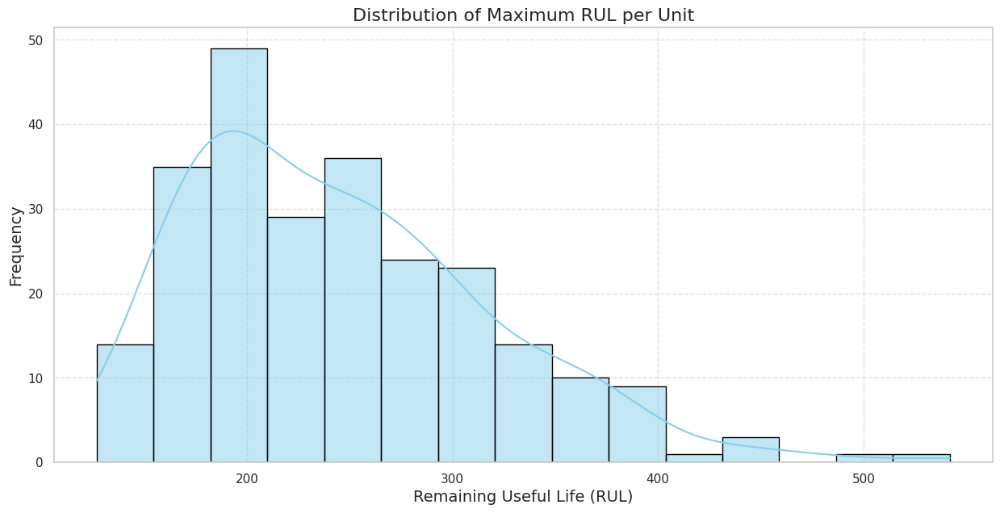

In [ ]:
#plotting
#faire des represetation graphique
# est important pour comprendre les districutions
df_max_rul = train[['unit_nr', 'RUL']].groupby('unit_nr').max().reset_index()
# Configuration du style pour améliorer l'apparence
sns.set_theme(style="whitegrid")

# Histogramme avec des ajustements
plt.figure(figsize=(15, 7))
sns.histplot(df_max_rul['RUL'], bins=15, kde=True, color='skyblue', edgecolor='black')
plt.title('Distribution of Maximum RUL per Unit', fontsize=16)
plt.xlabel('Remaining Useful Life (RUL)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()



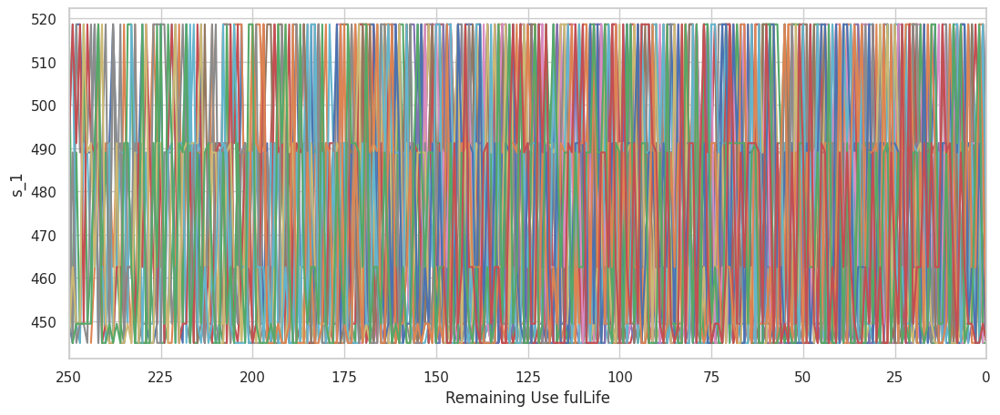

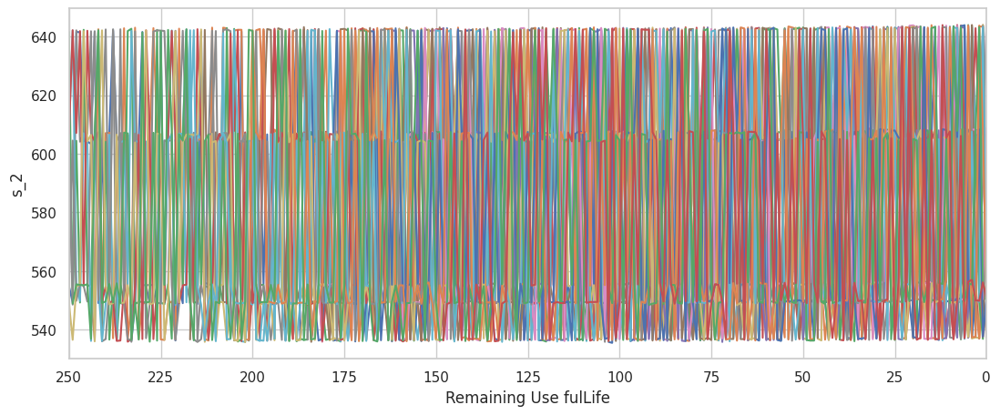

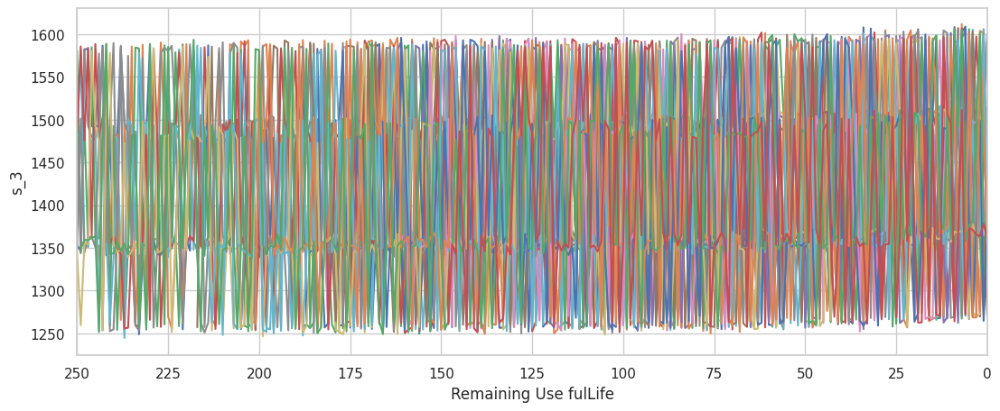

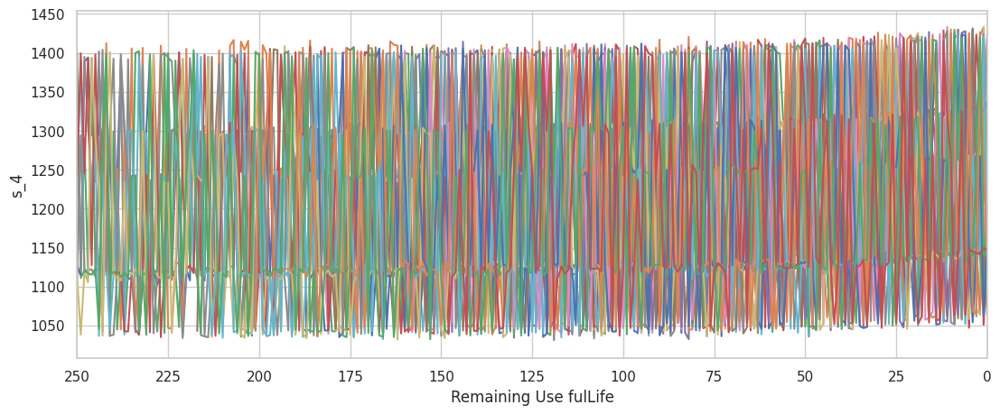

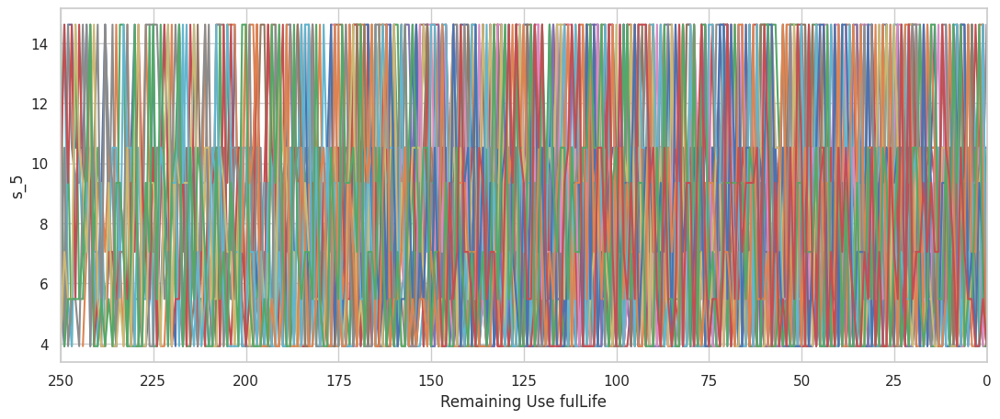

...

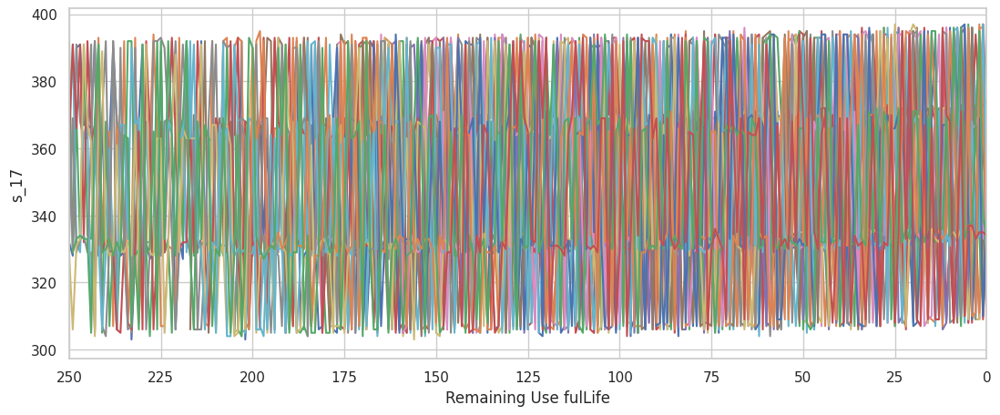

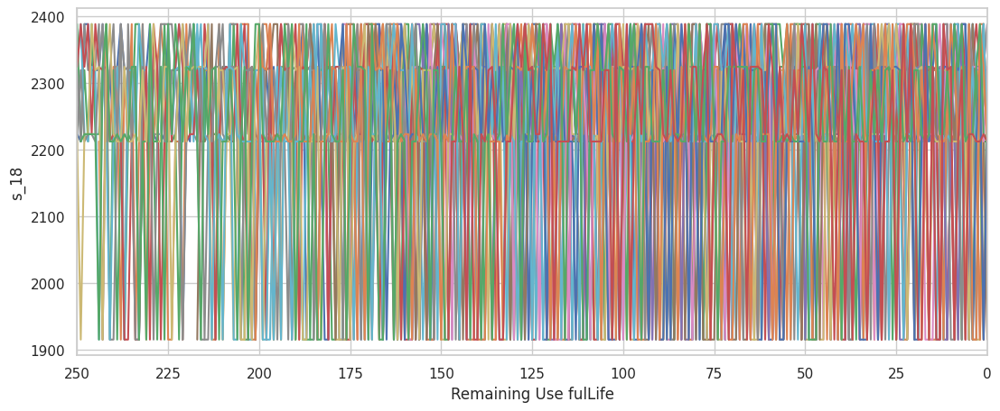

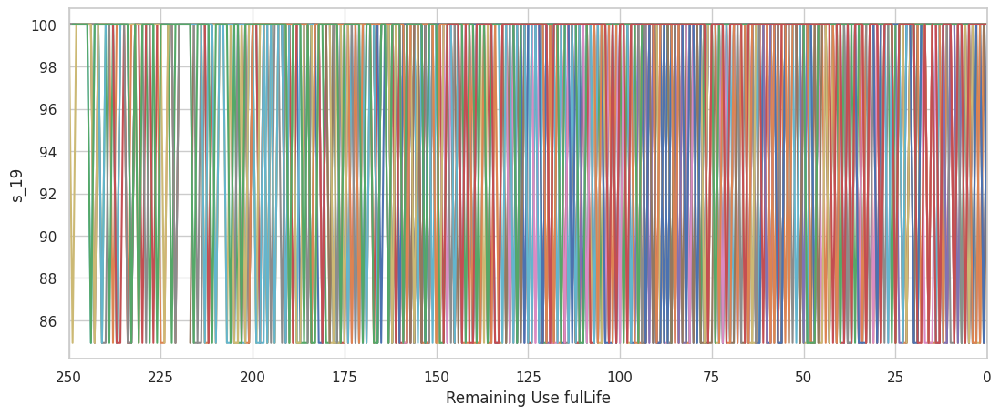

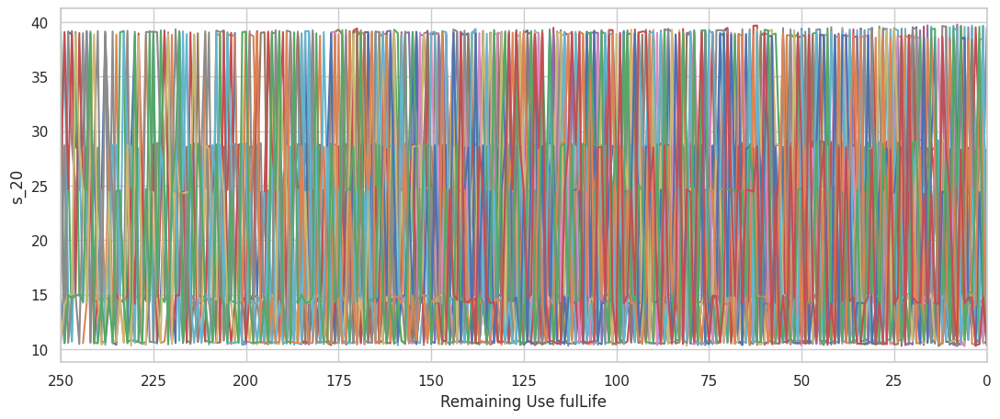

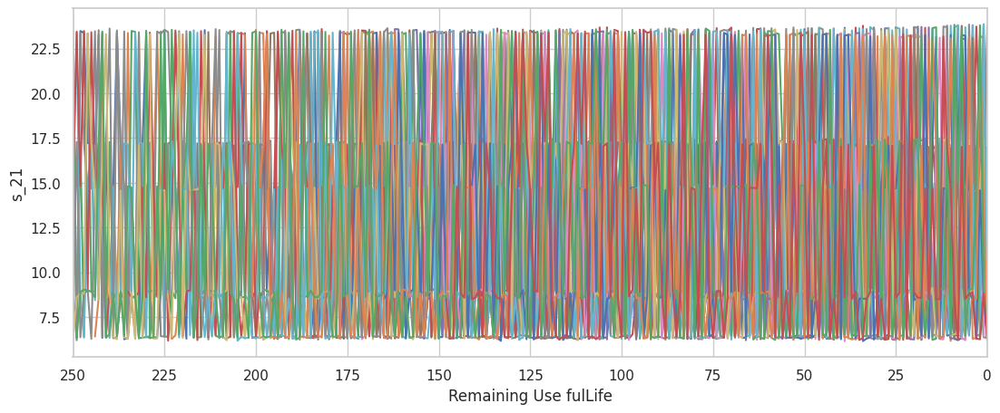

In [ ]:
def plot_sensor(sensor_name):
    plt.figure(figsize=(13,5))
    for i in train['unit_nr'].unique():
        if (i % 10 == 0):  # only plot every 10th unit_nr
            plt.plot('RUL', sensor_name,
                     data=train[train['unit_nr']==i])
    plt.xlim(250, 0)  # reverse the x-axis so RUL counts down to zero
    plt.xticks(np.arange(0, 275, 25))
    plt.ylabel(sensor_name)
    plt.xlabel('Remaining Use fulLife')
    plt.show()

for sensor_name in sensor_names:
    plot_sensor(sensor_name)

We can reconfirm the exclusion of sensors 1, 5, 16, 18 and 19. Sensors 6 and 10 get the benefit of the doubt.  
Note sensors 7, 12, 15, 20 and 21, in which the two distinct faults seem visible

## Feature extraction



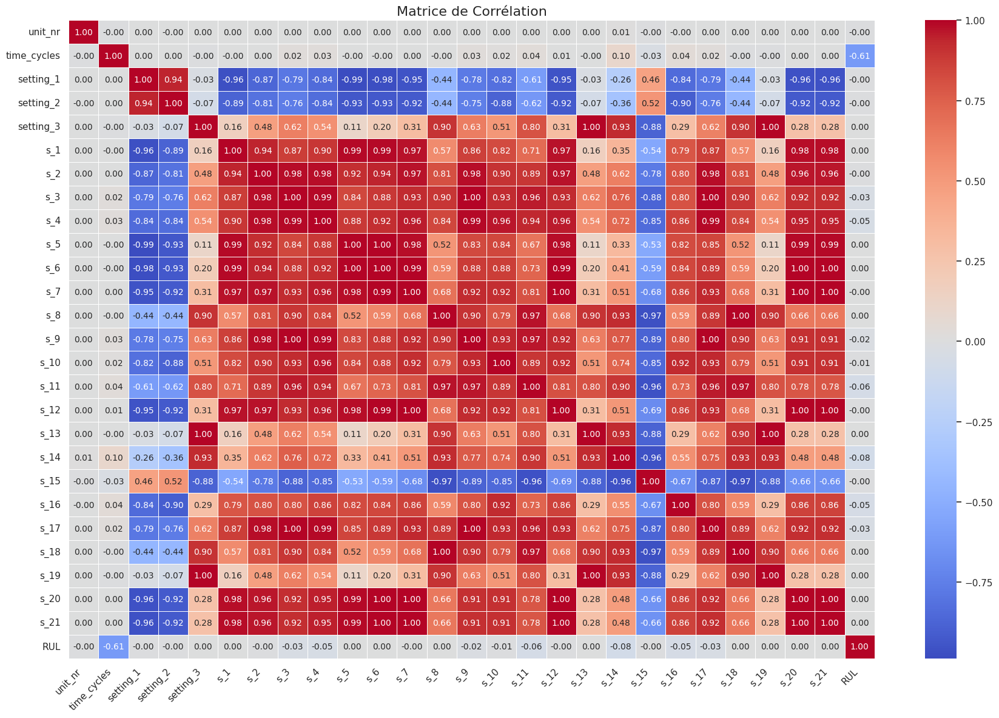

In [ ]:
def corr_matrix(data):

    plt.figure(figsize=(18, 12))  # Augmente la taille de la figure


    sns.heatmap(
        data.corr(),
        annot=True,
        fmt=".2f",  # Limite les nombres à 2 décimales
        cmap='coolwarm',
        annot_kws={"size": 10},  # Définit la taille des annotations
        linewidths=0.5  # Ajoute des séparateurs entre les cellules
    )
    plt.xticks(rotation=45, ha='right')  # Rend les labels plus lisibles
    plt.yticks(rotation=0)  # Labels y en orientation horizontale
    plt.title("Matrice de Corrélation", fontsize=16)  # Titre plus lisible
    plt.tight_layout()  # Évite les débordements
    plt.show()

# Utilisation
corr_matrix(train)


In [ ]:
# Calculer la matrice de corrélation
correlation = train.corr()

# Sélectionner les caractéristiques fortement corrélées avec 'RUL'
train_relevant_features = correlation[abs(correlation['RUL']) >= 0.01]

# Extraire uniquement la colonne pour 'RUL'
train_relevant_features['RUL']


,RUL
time_cycles,-0.610620
s_3,-0.032924
s_4,-0.045881
s_9,-0.024727
s_11,-0.056639
s_14,-0.078126
s_16,-0.053804
s_17,-0.032939
RUL,1.000000


In [ ]:
# Création d'une liste contenant uniquement les caractéristiques importantes
list_relevant_features = train_relevant_features.index

list_relevant_features = list_relevant_features[1:]  # Exclut 'RUL' de la liste

# Conserver uniquement ces caractéristiques importantes dans le jeu d'entraînement
train = train[list_relevant_features]

# Séparer le jeu d'entraînement en x_train (caractéristiques) et y_train (RUL)
y_train = train['RUL']
x_train = train.drop(['RUL'], axis=1)

# Conserver uniquement les colonnes/caractéristiques de x_train dans le jeu de test
x_test = x_test[x_train.columns]

# Affichage des premières lignes de x_train
x_train.head()


,s_3,s_4,s_9,s_11,s_14,s_16,s_17
0,1343.43,1112.93,8311.32,41.69,8074.83,0.02,330
1,1477.61,1237.50,8713.60,43.94,8046.13,0.02,361
2,1343.12,1117.05,8306.69,41.66,8066.62,0.02,329
3,1341.24,1118.03,8312.35,41.68,8076.05,0.02,328
4,1255.23,1033.59,7994.94,36.48,7865.80,0.02,305


## Standardisation

In [ ]:
# Premièrement, créer une fonction d'évaluation
def evaluate(y_true, y_hat, label='test'):
    mse = mean_squared_error(y_true, y_hat)
    rmse = np.sqrt(mse)
    variance = r2_score(y_true, y_hat)
    print('{} set RMSE:{}, R2:{}'.format(label, rmse, variance))
    return rmse, variance

In [ ]:
# Standardisation des caractéristiques
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train_trans = sc.fit_transform(x_train)
x_test_trans = sc.transform(x_test)


## Régression linéaire

train set RMSE:85.65969989309652, R2:0.08973426515220395
test set RMSE:71.8381963763818, R2:-0.7359560114066017


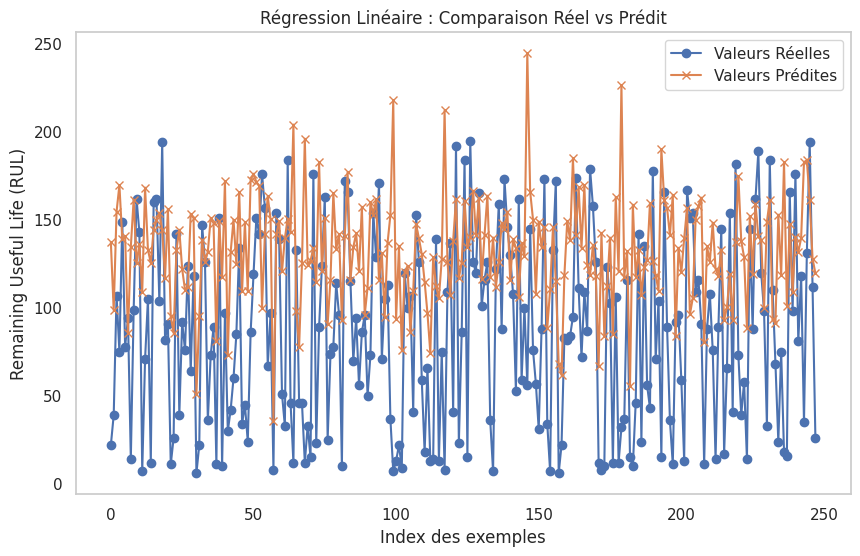

In [ ]:
# Modèle de régression linéaire
from sklearn.linear_model import LinearRegression
y_train_clipped = y_train.clip(upper =125)
lm = LinearRegression()
lm.fit(x_train_trans, y_train)

# Prédire et évaluer
y_hat_train = lm.predict(x_train_trans)
RMSE_Train, R2_Train = evaluate(y_train, y_hat_train, 'train')

y_hat_test = lm.predict(x_test_trans)
RMSE_Test, R2_Test = evaluate(y_test, y_hat_test, 'test')

# Visualisation des résultats
plt.figure(figsize=(10, 6))
plt.plot(range(len(y_test)), y_test, label='Valeurs Réelles', marker='o')
plt.plot(range(len(y_test)), y_hat_test, label='Valeurs Prédites', marker='x')
plt.title("Régression Linéaire : Comparaison Réel vs Prédit")
plt.xlabel("Index des exemples")
plt.ylabel("Remaining Useful Life (RUL)")
plt.legend()
plt.grid()
plt.show()

train set RMSE:47.60360431618489, R2:0.0937716601504136
test set RMSE:55.455769566970766, R2:-0.03447821377434668


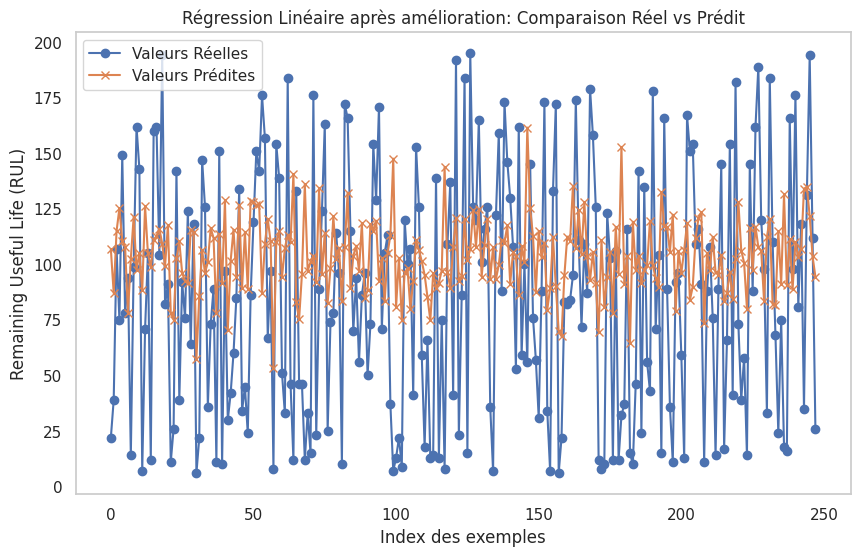

In [ ]:
# Modèle de régression linéaire clipped
from sklearn.linear_model import LinearRegression
y_train_clipped = y_train.clip(upper =150)
lm = LinearRegression()
lm.fit(x_train_trans, y_train_clipped)

# Prédire et évaluer
y_hat_train = lm.predict(x_train_trans)
RMSE_Train, R2_Train = evaluate(y_train_clipped, y_hat_train, 'train')

y_hat_test = lm.predict(x_test_trans)
RMSE_Test, R2_Test = evaluate(y_test, y_hat_test, 'test')

# Visualisation des résultats
plt.figure(figsize=(10, 6))
plt.plot(range(len(y_test)), y_test, label='Valeurs Réelles', marker='o')
plt.plot(range(len(y_test)), y_hat_test, label='Valeurs Prédites', marker='x')
plt.title("Régression Linéaire après amélioration: Comparaison Réel vs Prédit")
plt.xlabel("Index des exemples")
plt.ylabel("Remaining Useful Life (RUL)")
plt.legend()
plt.grid()
plt.show()

## Régression polynomiale

train set RMSE:27.30142961790909, R2:0.7019228093523565
test set RMSE:32.480525498361196, R2:0.6451261730251153


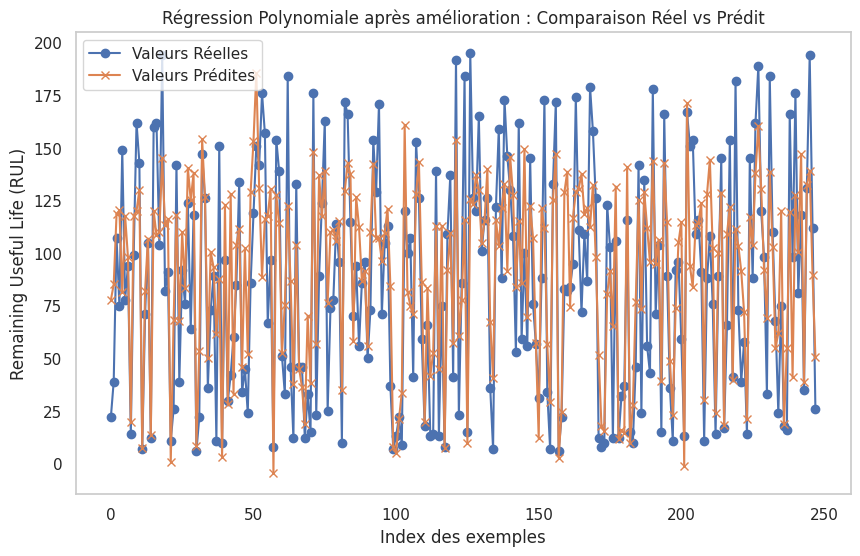

In [ ]:
# Régression polynomiale clipped
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

# Définir les caractéristiques polynomiales avec un degré de 4
poly_reg = PolynomialFeatures(degree=4)
x_poly = poly_reg.fit_transform(x_train_trans)

# Créer le modèle de régression linéaire
lin_reg_2 = LinearRegression()
lin_reg_2.fit(x_poly, y_train_clipped)

# Prédire et évaluer
y_hat_train = lin_reg_2.predict(x_poly)
RMSE_Train, R2_Train = evaluate(y_train_clipped, y_hat_train, 'train')

y_hat_test = lin_reg_2.predict(poly_reg.fit_transform(x_test_trans))
RMSE_Test, R2_Test = evaluate(y_test, y_hat_test, 'test')

# Visualisation des résultats
plt.figure(figsize=(10, 6))
plt.plot(range(len(y_test)), y_test, label='Valeurs Réelles', marker='o')
plt.plot(range(len(y_test)), y_hat_test, label='Valeurs Prédites', marker='x')
plt.title("Régression Polynomiale après amélioration : Comparaison Réel vs Prédit")
plt.xlabel("Index des exemples")
plt.ylabel("Remaining Useful Life (RUL)")
plt.legend()
plt.grid()
plt.show()

## Régression par Support Vector Machine (SVR)


In [ ]:
#feature engineering
from sklearn.preprocessing import PolynomialFeatures
# 2nd degree polynomialFeatures of [a, b] becomes [1, a, b, a^2, ab, b^2]
poly = PolynomialFeatures(2)
X_train_transformed = poly.fit_transform(x_train_trans)
X_test_transformed = poly.fit_transform(x_test_trans)

print(x_train_trans.shape)
print(X_train_transformed.shape)

(61249, 7)
(61249, 36)


In [ ]:
# SVM + clipped RUL + engineered features
# SVR
from sklearn.svm import SVR

# Création du modèle
regressor = SVR(kernel='rbf')

# Entraînement
regressor.fit(X_train_transformed, y_train_clipped)

# Prédictions et évaluation
y_hat_train = regressor.predict(X_train_transformed)
RMSE_Train, R2_Train = evaluate(y_train_clipped, y_hat_train)

y_hat_test = regressor.predict(X_test_transformed)
RMSE_Train, R2_Train = evaluate(y_test, y_hat_test)


test set RMSE:36.27387344393843, R2:0.4738060710405134
test set RMSE:46.96469689876097, R2:0.2580563476584631


In [ ]:
from sklearn.feature_selection import SelectFromModel
# Use 'linear' kernel instead of 'rbf' for feature selection
regressor_linear = SVR(kernel='linear')
regressor_linear.fit(X_train_transformed, y_train_clipped)

select_features = SelectFromModel(regressor_linear, threshold='mean', prefit=True)
select_features.get_support()

# Use get_feature_names_out() instead of get_feature_names() for scikit-learn >= 0.24
try:
    feature_names = poly.get_feature_names_out()  # For scikit-learn >= 0.24
except AttributeError:
    feature_names = poly.get_feature_names()  # For older scikit-learn versions

# Use the original DataFrame variable name (x_train)
print('Original features:\n', x_train.columns)
print('Best features:\n', np.array(feature_names)[select_features.get_support()])
np.array(feature_names)[select_features.get_support()].shape

Original features:
 Index(['s_3', 's_4', 's_9', 's_11', 's_14', 's_16', 's_17'], dtype='object')
Best features:
 ['x1' 'x2' 'x3' 'x5' 'x0 x5' 'x1 x2' 'x1 x5' 'x2 x4' 'x2 x5' 'x3^2'
 'x3 x4' 'x4 x5' 'x5 x6']


(13,)

train set RMSE:36.45179219847687, R2:0.46863158284122286
test set RMSE:47.26945455832539, R2:0.24839604284797756


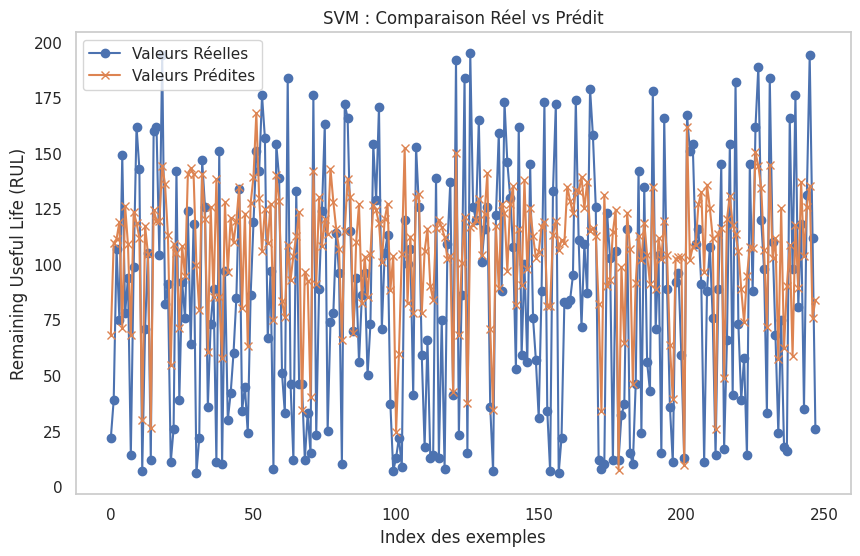

In [ ]:
# SVM regression + clipped RUL + engineered features + selection
svr = SVR(kernel='rbf')
svr.fit(X_train_transformed[:, select_features.get_support()], y_train_clipped)

# predict and evaluate
y_hat_train = svr.predict(X_train_transformed[:, select_features.get_support()])
evaluate(y_train_clipped, y_hat_train, 'train')

y_hat_test = svr.predict(X_test_transformed[:, select_features.get_support()])
evaluate(y_test, y_hat_test)

# Visualisation des résultats
plt.figure(figsize=(10, 6))
plt.plot(range(len(y_test)), y_test, label='Valeurs Réelles', marker='o')
plt.plot(range(len(y_test)), y_hat_test, label='Valeurs Prédites', marker='x')
plt.title("SVM : Comparaison Réel vs Prédit")
plt.xlabel("Index des exemples")
plt.ylabel("Remaining Useful Life (RUL)")
plt.legend()
plt.grid()
plt.show()

In [ ]:
print('Valeur de epsilon par défaut :',svr.epsilon)

Valeur de epsilon par défaut : 0.1


In [ ]:
#Amélioration de SVR (epsilon)
epsilon = [0.4, 0.3, 0.2, 0.1, 0.05]

for e in epsilon:
    svr = SVR(kernel='rbf', epsilon=e)
    svr.fit(X_train_transformed[:, select_features.get_support()], y_train_clipped)

    # predict and evaluate
    y_hat = svr.predict(X_train_transformed[:, select_features.get_support()])
    mse = mean_squared_error(y_train_clipped, y_hat)
    rmse = np.sqrt(mse)
    variance = r2_score(y_train_clipped, y_hat)
    print("epsilon:", e, "RMSE:", rmse, "R2:", variance)



epsilon: 0.4 RMSE: 36.453560076466104 R2: 0.46858003984418006
epsilon: 0.3 RMSE: 36.45257622613198 R2: 0.4686087245953423
epsilon: 0.2 RMSE: 36.451046215510964 R2: 0.4686533314416539
epsilon: 0.1 RMSE: 36.45179219847687 R2: 0.46863158284122286
epsilon: 0.05 RMSE: 36.450142359151755 R2: 0.46867968213173283


##Régression par Support Vector Machine à kernel linéaire


test set RMSE:40.441134131181634, R2:0.3459595344180797
test set RMSE:50.901569070564385, R2:0.1284541971147981


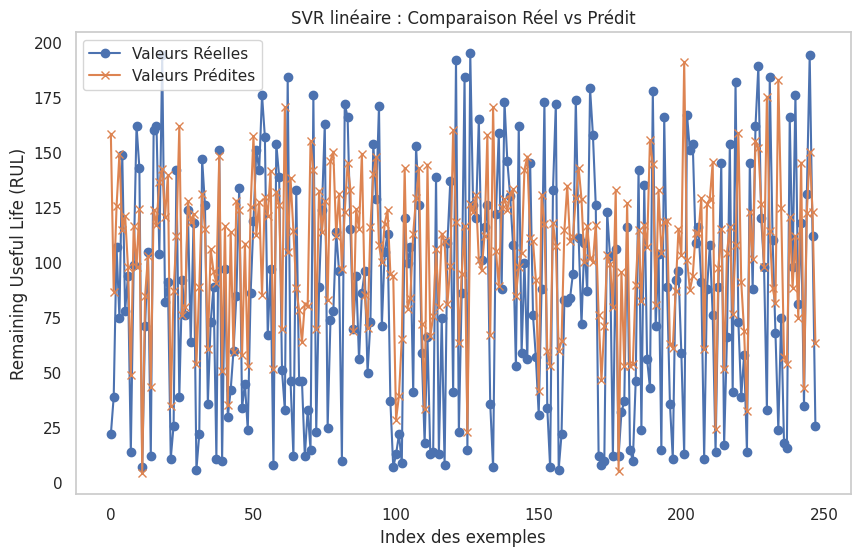

In [ ]:
# SVM lineaire + clipped RUL + engineered features
# SVR
from sklearn.svm import SVR

# Création du modèle
regressor = SVR(kernel='linear')

# Entraînement
regressor.fit(X_train_transformed, y_train_clipped)

# Prédictions et évaluation
y_hat_train = regressor.predict(X_train_transformed)
RMSE_Train, R2_Train = evaluate(y_train_clipped, y_hat_train)

y_hat_test = regressor.predict(X_test_transformed)
RMSE_Train, R2_Train = evaluate(y_test, y_hat_test)

# Visualisation des résultats
plt.figure(figsize=(10, 6))
plt.plot(range(len(y_test)), y_test, label='Valeurs Réelles', marker='o')
plt.plot(range(len(y_test)), y_hat_test, label='Valeurs Prédites', marker='x')
plt.title("SVR linéaire : Comparaison Réel vs Prédit")
plt.xlabel("Index des exemples")
plt.ylabel("Remaining Useful Life (RUL)")
plt.legend()
plt.grid()
plt.show()

## Régression par Decision tree


train set RMSE:17.370736720676668, R2:0.8175265773347474
test set RMSE:34.29141492160384, R2:0.604452461386724


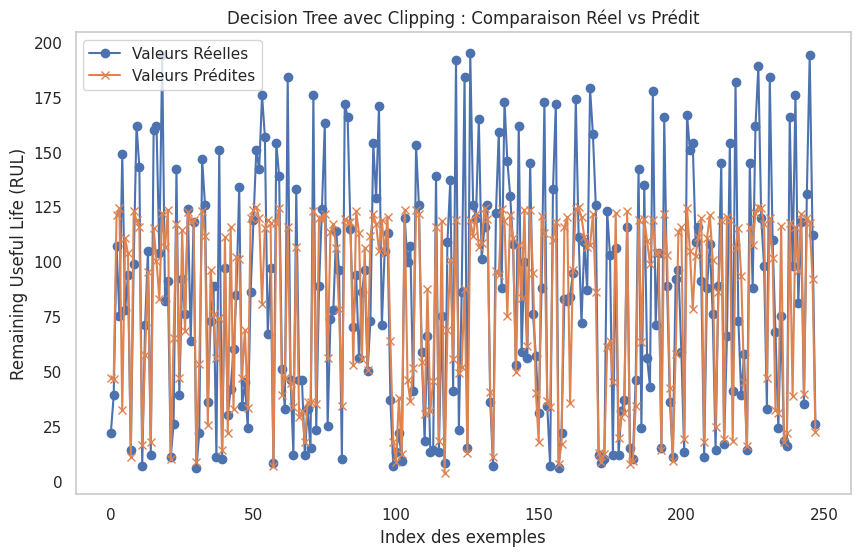

In [ ]:
# Decision Tree avec clipping
from sklearn.tree import DecisionTreeRegressor

# Appliquer le clipping sur y_train
y_train_clipped = y_train.clip(upper=125)

# Création du modèle
dt = DecisionTreeRegressor(random_state=42, max_depth=15, min_samples_leaf=10)

# Entraînement avec y_train_clipped
dt.fit(x_train_trans, y_train_clipped)

# Prédictions et évaluation sur le jeu d'entraînement
y_hat_train = dt.predict(x_train_trans)
RMSE_Train, R2_Train = evaluate(y_train_clipped, y_hat_train, 'train')

# Prédictions et évaluation sur le jeu de test
y_hat_test = dt.predict(x_test_trans)
RMSE_Test, R2_Test = evaluate(y_test, y_hat_test, 'test')

# Visualisation des résultats
plt.figure(figsize=(10, 6))
plt.plot(range(len(y_test)), y_test, label='Valeurs Réelles', marker='o')
plt.plot(range(len(y_test)), y_hat_test, label='Valeurs Prédites', marker='x')
plt.title("Decision Tree avec Clipping : Comparaison Réel vs Prédit")
plt.xlabel("Index des exemples")
plt.ylabel("Remaining Useful Life (RUL)")
plt.legend()
plt.grid()
plt.show()


## Régression par Random forest

train set RMSE:24.98525827750739, R2:0.6224879412909212
test set RMSE:39.981861812408894, R2:0.4622828309227617


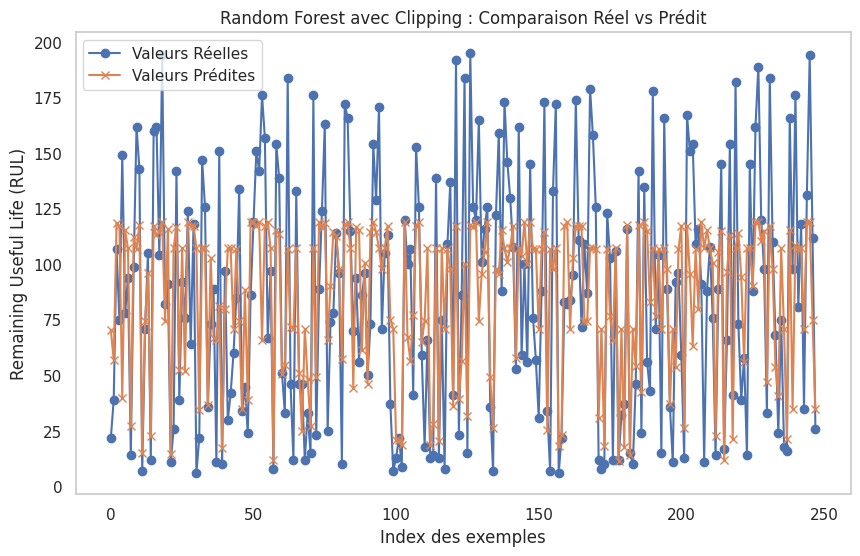

In [ ]:
# Random Forest avec clipping
from sklearn.ensemble import RandomForestRegressor

# Appliquer le clipping sur y_train
y_train_clipped = y_train.clip(upper=125)

# Création du modèle
rf = RandomForestRegressor(random_state=42, n_jobs=-1, max_depth=6, min_samples_leaf=5)

# Entraînement avec y_train_clipped
rf.fit(x_train_trans, y_train_clipped)

# Prédictions et évaluation sur le jeu d'entraînement
y_hat_train = rf.predict(x_train_trans)
RMSE_Train, R2_Train = evaluate(y_train_clipped, y_hat_train, 'train')

# Prédictions et évaluation sur le jeu de test
y_hat_test = rf.predict(x_test_trans)
RMSE_Test, R2_Test = evaluate(y_test, y_hat_test, 'test')

# Visualisation des résultats
plt.figure(figsize=(10, 6))
plt.plot(range(len(y_test)), y_test, label='Valeurs Réelles', marker='o')
plt.plot(range(len(y_test)), y_hat_test, label='Valeurs Prédites', marker='x')
plt.title("Random Forest avec Clipping : Comparaison Réel vs Prédit")
plt.xlabel("Index des exemples")
plt.ylabel("Remaining Useful Life (RUL)")
plt.legend()
plt.grid()
plt.show()


## Artificial Neural Network (ANN)

In [ ]:
# Réseau de neurones artificiels (ANN) avec clipping
import tensorflow as tf

# Appliquer le clipping sur y_train
y_train_clipped = y_train.clip(upper=125)

# Création du modèle séquentiel
ann = tf.keras.models.Sequential()

# Ajout des couches cachées avec activation ReLU
ann.add(tf.keras.layers.Dense(units=10, activation='relu'))
ann.add(tf.keras.layers.Dense(units=10, activation='relu'))

# Ajout de la couche de sortie
ann.add(tf.keras.layers.Dense(units=1))

# Compilation du modèle avec l'optimiseur Adam et une fonction de perte MSE
ann.compile(optimizer='adam', loss='mean_squared_error')

# Entraînement du modèle avec y_train_clipped
ann.fit(x_train_trans, y_train_clipped, batch_size=32, epochs=75)

# Prédictions et évaluation pour les données d'entraînement
y_hat_train = ann.predict(x_train_trans)
RMSE_Train, R2_Train = evaluate(y_train_clipped, y_hat_train, 'train')

# Prédictions et évaluation pour les données de test
y_hat_test = ann.predict(x_test_trans)
RMSE_Test, R2_Test = evaluate(y_test, y_hat_test, 'test')

# Visualisation des résultats
plt.figure(figsize=(10, 6))
plt.plot(range(len(y_test)), y_test, label='Valeurs Réelles', marker='o')
plt.plot(range(len(y_test)), y_hat_test, label='Valeurs Prédites', marker='x')
plt.title("ANN avec Clipping : Comparaison Réel vs Prédit")
plt.xlabel("Index des exemples")
plt.ylabel("Remaining Useful Life (RUL)")
plt.legend()
plt.grid()
plt.show()


Epoch 1/75
1915/1915 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 5474.8979
Epoch 2/75
1915/1915 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 1732.6307
Epoch 3/75
1915/1915 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 1635.4581
Epoch 4/75
1915/1915 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step - loss: 1563.2585
Epoch 5/75
1915/1915 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 1422.7008
Epoch 6/75
1915/1915 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - loss: 1295.6050
Epoch 7/75
1915/1915 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step - loss: 1206.9076
Epoch 8/75
1915/1915 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 1167.9109
Epoch 9/75
1915/1915 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - loss: 1122.1862
Epoch 10/75
1915/1915 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 1086.0427
Epoch 11/75
1915/1915 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 1036.0931
Epoch 12/75
1915/1915 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 999.6726
Epoch 13/75
1915/1915 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 964.7551
Epoch 14/75
1915/1915 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - loss:

## KNN

In [ ]:
# KNN Regressor avec clipping
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error

# Appliquer le clipping sur y_train
y_train_clipped = y_train.clip(upper=125)

# Étape 1 : Choisir la valeur optimale de k
k_values = range(1, 21)  # Tester k de 1 à 20
errors = []

# Tester chaque valeur de k
for k in k_values:
    knn = KNeighborsRegressor(n_neighbors=k)
    knn.fit(x_train_trans, y_train_clipped)
    y_pred = knn.predict(x_test_trans)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    errors.append(rmse)

# Déterminer la valeur optimale de k
optimal_k = k_values[np.argmin(errors)]
print(f"Valeur optimale de k: {optimal_k} avec RMSE = {min(errors):.4f}")

# Étape 2 : Création du modèle avec k optimal
knn = KNeighborsRegressor(n_neighbors=optimal_k)

# Entraînement avec y_train_clipped
knn.fit(x_train_trans, y_train_clipped)

# Prédictions et évaluation pour les données d'entraînement
y_hat_train = knn.predict(x_train_trans)
RMSE_Train, R2_Train = evaluate(y_train_clipped, y_hat_train, 'train')

# Prédictions et évaluation pour les données de test
y_hat_test = knn.predict(x_test_trans)
RMSE_Test, R2_Test = evaluate(y_test, y_hat_test, 'test')

# Visualisation des résultats
plt.figure(figsize=(10, 6))
plt.plot(range(len(y_test)), y_test, label='Valeurs Réelles', marker='o')
plt.plot(range(len(y_test)), y_hat_test, label='Valeurs Prédites', marker='x')
plt.title("KNN Regressor avec Clipping : Comparaison Réel vs Prédit")
plt.xlabel("Index des exemples")
plt.ylabel("Remaining Useful Life (RUL)")
plt.legend()
plt.grid()
plt.show()
